# CME 193 – Lecture 9: Transformers and Hugging Face

In this notebook we build an intuitive understanding of Transformer-based models for NLP and see how to use the Hugging Face `transformers` library for inference and (lightweight) fine-tuning. The goal is **practical intuition**, not theory proofs: by the end, you should be able to read a model card, run a `pipeline`, inspect tokenization, and understand the difference between a backbone model and a task-specific head.

We will roughly follow these stages:

1. **Big picture** – What is a Transformer and why did it replace RNNs for many tasks?
2. **Hugging Face ecosystem & `pipeline`** – High-level inference with one line of code.
3. **Tokenizers & tensors** – Turning raw text into `input_ids`, `attention_mask`, and PyTorch tensors.
4. **AutoModel & task-specific heads** – Backbones vs. `AutoModelForSequenceClassification`.
5. **Devices & performance** – CPU vs GPU/MPS and the `device` argument.
6. **Minimal fine-tuning demo** – How you would adapt a pre-trained model to a new task.
7. **Ethics & model cards** – Reading model cards and talking about appropriate use.

Throughout the notebook, whenever we introduce a new library API, we will reference the **official documentation** in comments so you can dig deeper on your own.


## Announcements

- Homework 2 has been released and will be due on 12/1/2025 (the Monday after Thanksgiving).
- You can apply your grace period for these two assignments, email me (`tianyudu@stanford.edu`) if additional extensions are needed.
- You will need to submit all homework assignments and attendance form by 12/14/2025 (Sunday) to get the final course score.
- There is *no* final project/exam for this course.

## Notes on Hardware and Computational Resource Requirements
- In this lecture, we will run a few more complicated deep learning models (i.e., transformers), so please make sure your hardware has enough memory.
- You can run this notebook locally (CPU is fine for tasks in this lecture) or in Colab.
- For heavier models or fine-tuning, Colab with GPU acceleration is recommended.

In [1]:
# Uncomment the line(s) below in Colab/local environments without the required libraries installed.
# This cell assumes you have already installed PyTorch from the previous lecture.
# Hugging Face transformers docs (overview): https://huggingface.co/docs/transformers/index
# Datasets library docs: https://huggingface.co/docs/datasets/index
# ! pip install -U transformers datasets accelerate

# If you see import errors in later cells, come back and run this cell first.

In [2]:
import sys

import torch
from transformers import (
    AutoModel,
    AutoModelForSequenceClassification,
    AutoTokenizer,
    pipeline,
    Trainer,
    TrainingArguments,
)

print(f"Python: {sys.version.split()[0]}")
print(f"PyTorch: {torch.__version__}")
try:
    import transformers
    print(f"transformers: {transformers.__version__}")
except ImportError:  # pragma: no cover
    transformers = None
    print("transformers: not available (run the install cell above)")

# Run the pipeline on the image
# Set random seed for reproducibility
import torch
import random
import numpy as np

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

/Users/tianyudu/miniforge3/envs/cme193-autumn-2025/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Python: 3.12.11
PyTorch: 2.8.0
transformers: 4.57.1


---
## Big picture: what is a Transformer?

At a high level, a **Transformer** is a neural network architecture capturing the following *conditional distribution* of tokens in a sequence:

$$
p(\text{next word} \mid \text{prompt words})
$$

One can use the "chain rule" to generate a distribution over the sequence of response texts given a prompt:

$$
p(\text{response words} \mid \text{prompt words}) = \prod_{i=1}^n p(i^{th} \text{ word in response} \mid \text{prompt words} + \text{first } i-1 \text{ words in response})
$$

By modeling this conditional distribution, a Transformer can generate a sequence of tokens that are *coherent* and *context-aware* conditional on the prompt provided by the user.

The transformer architecture is built from repeated blocks of:

- **Multi-head self-attention** – each token "looks at" other tokens in the sequence and learns which ones are relevant.
- **Feed-forward layers** – position-wise MLPs applied independently to each token embedding.
- **Residual connections + layer normalization** – help stabilize deep stacks of blocks.

Instead of processing sequences step-by-step like RNNs, Transformers process all tokens **in parallel**, which makes them:

- **Better at long-range dependencies** (attention can connect any two positions directly). Traditional RNNs suffer from the vanishing/exploding gradient problem, so they are not able to capture long-range dependencies. There are some designs to improve RNNs' ability to capture long-range dependencies, such as LSTM and GRU.
- **Faster to train** on modern hardware (GPUs/TPUs): traditional RNNs are sequential in processing words, so they are inherently slow to run.

### Suggested reading materials:
Here are a few sources that I highly recommend for those who want to dive deeper into the details of the transformer architecture:

- **CME 295 - Transformers & Large Language Models** - Comprehensive overview of different design tricks in transformers and their applications to LLMs (https://cme295.stanford.edu/)
- **Illustrated Transformer (Jay Alammar)** – overall encoder–decoder picture and attention animations: https://jalammar.github.io/illustrated-transformer/
- **Transformer architecture breakdown (Jeremy Jordan)** – clear figures for multi-head attention and stacked blocks: https://www.jeremyjordan.me/transformer-architecture/
- **Encoder–decoder schematic (GeeksforGeeks)** – clean textbook-style diagram: https://www.geeksforgeeks.org/deep-learning/architecture-and-working-of-transformers-in-deep-learning/

In this notebook, we do **not** implement attention from scratch; instead, we treat the Transformer as a powerful building block exposed via the Hugging Face `transformers` APIs.

---
# Training a model from scratch versus use a pre-trained model versus fine-tuning a pre-trained model

Below is a high-level comparison of three common workflows when using Transformer models.

| **Approach** | **What you start from** | **Typical procedure** | **Data requirements** | **Compute cost (time/$$)** | **Typical use cases** | **Expected performance** |
| --- | --- | --- | --- | --- | --- | --- |
| **Train from scratch** | **Randomly initialized parameters** (no prior knowledge) | **Train everything**: design an architecture, initialize weights, and train on a large corpus from the beginning until convergence | **Very large** task-specific dataset (often billions of tokens) | **Highest** – many epochs, large accelerators (multi-GPU/TPU), and careful engineering | **Foundation models / new architectures** at large labs, research on novel modalities | **Best only when you have massive data + compute**; otherwise tends to overfit or underperform |
| **Use a pre-trained model as-is** | **Pre-trained backbone only** (e.g., language model) with no or minimal task head | **Inference-only**: load the model, add light post-processing, and use it directly without updating weights | **No task-specific labels** (or a tiny set just for evaluation) | **Lowest** – just forward passes, no training loop | **Quick prototypes, zero-shot evaluation, feature extraction**, simple internal tools | **Good if your task ≈ pre-training domain**; weaker for specialized or highly structured tasks |
| **Fine-tune a pre-trained model** | **Pre-trained backbone + small head** (or minor architecture tweaks) | **Short training loop**: start from pre-trained weights and fine-tune on your labeled dataset with a smaller learning rate | **Moderate labeled dataset** (hundreds → tens of thousands of examples) | **Moderate** – far cheaper than scratch, but more than inference-only | **Production classifiers, domain adaptation** (e.g., medical/legal text), smaller custom assistants | **Often the best trade-off**: strong task-specific performance with manageable data and compute requirements |

---

## Hugging Face ecosystem and `pipeline`

The **Hugging Face ecosystem** provides a unified interface to Transformer models:

- **`transformers`** – model architectures, tokenizers, configuration classes, and high-level inference APIs.
- **`datasets`** – standard NLP datasets with lazy loading and dataset operations.
- **`accelerate`** – utilities for scaling training/inference across devices.

A key idea is the **`pipeline` abstraction**:

> "Pipelines are high-level objects which automatically handle tokenization, model invocation, and post-processing for a given task."  
> — Hugging Face transformers docs, "Pipelines" (API: https://huggingface.co/docs/transformers/en/main_classes/pipelines)

Internally, a `pipeline` bundles together:

- a **tokenizer** (text → tokens → IDs/tensors),
- a **model** (Transformers + optional task-specific head), and
- pre/post-processing logic for the task.

### A first look at `transformers.pipeline`

The pipeline provides an end-to-end inference interface for a given task.

Below is a (non-exhaustive) list of built-in tasks supported by `transformers.pipeline`. For each task, we summarize the typical **input**, **output**, and a few **applications**. See the official docs for the full and up-to-date list of tasks and arguments:

| **Task (pipeline name)** | **Typical input** | **Typical output** | **Example applications** |
| --- | --- | --- | --- |
| `text-classification` / `sentiment-analysis` | One or more text strings | Labels (e.g. POSITIVE / NEGATIVE) with scores | Product review sentiment, social media monitoring, quick feedback analysis |
| `zero-shot-classification` | Text + list of candidate labels | Probabilities over user-provided labels | Classifying issues or emails into custom categories without task-specific training |
| `token-classification` / `ner` | Single sentence or short document | Entity tags for each token (e.g. PERSON, ORG) | Named-entity recognition, extracting people/places/organizations |
| `question-answering` | Question + context passage | Extractive answer span with score | FAQ bots over documents, reading-comprehension demos |
| `summarization` | Longer text document | Shorter summary text | Summarizing news articles, meeting notes, or reports |
| `text-generation` | Prompt text | Generated continuation of text | Story generation, code completion, creative writing assistants |
| `text2text-generation` | Input text (often in instruction style) | Output text (translation, summarization, etc.) | T5-style models for general sequence-to-sequence tasks |
| `translation` / `translation_xx_to_yy` | Text in source language | Text in target language | Translating sentences or documents between languages |
| `feature-extraction` | Text strings | Dense vector representations (embeddings) | Semantic search, clustering documents, retrieval systems |
| `audio-classification` | Audio waveform or file path | Audio labels with scores | Classifying sounds (music genre, speech commands, environmental sounds) |
| `zero-shot-audio-classification` | Audio + candidate labels | Scores per label | Tagging sounds with flexible, user-defined labels |
| `automatic-speech-recognition` | Audio waveform or file path | Transcribed text | Speech-to-text for captions, voice commands, call-center logs |
| `text-to-audio` / `text-to-speech` | Text prompt | Generated audio waveform | Voice assistants, audiobook generation, accessibility tools |
| `image-classification` | Image (array or file path/URL) | Image labels with scores | Classifying objects/scenes in photos |
| `zero-shot-image-classification` | Image + textual class names | Scores for each candidate label | Image tagging without task-specific fine-tuning |
| `object-detection` | Image | Bounding boxes + class labels | Detecting people/cars/objects in images or video frames |
| `zero-shot-object-detection` | Image + textual class names | Bounding boxes + scores per textual label | Flexible detection of arbitrary categories defined at inference time |
| `image-segmentation` | Image | Per-pixel or region masks + labels | Medical image segmentation, photo editing, scene understanding |
| `mask-generation` | Image | Segmentation masks (usually multiple regions) | Interactive image editing, background removal |
| `image-feature-extraction` | Image | Image embeddings (vectors) | Image retrieval, clustering, similarity search |
| `image-to-text` | Image | Generated caption text | Image captioning for accessibility or search |
| `image-text-to-text` | Image + text prompt | Generated text response | Visual question answering, image-grounded dialogue |
| `image-to-image` | Image (+ optional text prompt) | Transformed image | Style transfer, super-resolution, image editing |
| `depth-estimation` | Image | Per-pixel depth map | Robotics, AR/VR, 3D scene understanding |
| `keypoint-matching` | Pair of images | Matched keypoints/features | Image alignment, visual localization, structure-from-motion |
| `video-classification` | Video file or frames | Video-level labels with scores | Activity recognition, content moderation, video tagging |
| `table-question-answering` | Question + table (e.g. Pandas, JSON) | Answer text or cell value | Question answering over structured tables (spreadsheets, CSVs) |
| `document-question-answering` | Question + document (PDF/image) | Extracted answer text | QA over scanned documents, forms, and PDFs |
| `visual-question-answering` | Image + natural-language question | Answer text | Asking questions about images, multimodal assistants |

- API: transformers.pipeline — https://huggingface.co/docs/transformers/en/main_classes/pipelines

- Each pipeline comes with a default model (and the associated tokenizer as we will introduce in the next stage), if you create a pipeline for a given task **without** specifying a model, it will load the default model for the task.

- The default model is a small-scale model and isn't in general the best model for the task.

- For the first time loading the model, the Hugging Face `transformers` package will first download the model to your local machine; this could take a while depending on the model size and internet speed.

## Pipeline example 1: sentiment analysis (classification)

For example, the following code runs a **sentiment analysis** pipeline (a special case of `text-classification`):

**Input**: a text string

**Output**: a list of dictionaries, each containing the predicted sentiment and confidence score for the input text.

In [3]:
# import the pipeline wrapper from the Hugging Face `transformers` package
from transformers import pipeline

# define a pipeline for sentiment analysis
# here we leave the `model` argument empty, so that the pipeline will load the default model for the task
sentiment_pipe = pipeline(task="sentiment-analysis")

sentiment_pipe

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
Device set to use mps:0


In [4]:
# let's consider the following example with obvious positive sentiment
example_text_1 = "CME 193 is my favorite class this quarter!"

In [5]:
# to use the pipeline for sentiment classification, we simply call the pipeline on the example text.
text_1_sentiment = sentiment_pipe(example_text_1)

In [6]:
# the output is a list of dictionaries.
# for each item, it contains the predicted sentiment and confidence score for the input text.
text_1_sentiment

[{'label': 'POSITIVE', 'score': 0.9988577365875244}]

In [7]:
# let's now consider an example with negative sentiment
example_text_2 = "The documentation was confusing and the model behaved unpredictably."
text_2_sentiment = sentiment_pipe(example_text_2)
text_2_sentiment
# we can see that the default model correctly predicts the sentiment of the second example as negative.

[{'label': 'NEGATIVE', 'score': 0.9985367059707642}]

- Note that we are calling the pipeline on a single text string, but the output is a list of dictionaries.

- This is because the pipeline can be applied to a batch of texts at once, and the output is a list of dictionaries.

In [8]:
# example of pipeline batch processing.

example_text_batch = [
    "CME 193 is my favorite class this quarter!",
    "The documentation was confusing and the model behaved unpredictably.",
]
text_batch_sentiment = sentiment_pipe(example_text_batch)
text_batch_sentiment

[{'label': 'POSITIVE', 'score': 0.9988577365875244},
 {'label': 'NEGATIVE', 'score': 0.9985367059707642}]

## Pipeline example 2: named entity recognition (NER)

For example, the following code runs a **named entity recognition** pipeline (a special case of `token-classification`):

**Input**: a text string

**Output**: a list of dictionaries, each containing the predicted entity and confidence score for the input text.


In [9]:
# Named entity recognition (NER) with a token-classification pipeline

# API: transformers.pipeline — https://huggingface.co/docs/transformers/en/main_classes/pipelines
# API: TokenClassificationPipeline — https://huggingface.co/docs/transformers/en/main_classes/pipelines#transformers.TokenClassificationPipeline

# We create the token-classification pipeline for NER task.
ner_pipeline = pipeline(
    task="token-classification",  # alias: "ner"
    model="dslim/bert-base-NER",  # a common English NER model on the Hub
    aggregation_strategy=transformers.pipelines.token_classification.AggregationStrategy.SIMPLE  # use simple aggregation strategy.
)

example_ner_texts = [
    "Barack Obama was born in Hawaii.",
    "Stanford University is located in California.",
    "OpenAI is based in San Francisco.",
]

Some weights of the model checkpoint at dslim/bert-base-NER were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use mps:0


- The input is a text string.
- The output is a list of dictionaries, each containing the predicted **entity class** (e.g., organization, person, location, etc.) and **confidence score** for the input text.

In [10]:
for text in example_ner_texts:
    print(f"\nText: {text}")
    entities = ner_pipeline(text)
    for ent in entities:
        print(ent)


Text: Barack Obama was born in Hawaii.
{'entity_group': 'PER', 'score': np.float32(0.9992919), 'word': 'Barack Obama', 'start': 0, 'end': 12}
{'entity_group': 'LOC', 'score': np.float32(0.9997441), 'word': 'Hawaii', 'start': 25, 'end': 31}

Text: Stanford University is located in California.
{'entity_group': 'ORG', 'score': np.float32(0.9985678), 'word': 'Stanford University', 'start': 0, 'end': 19}
{'entity_group': 'LOC', 'score': np.float32(0.99945706), 'word': 'California', 'start': 34, 'end': 44}

Text: OpenAI is based in San Francisco.
{'entity_group': 'ORG', 'score': np.float32(0.9919475), 'word': 'OpenAI', 'start': 0, 'end': 6}
{'entity_group': 'LOC', 'score': np.float32(0.9992553), 'word': 'San Francisco', 'start': 19, 'end': 32}


### Pipeline example 3: Text Completion and Chatbot

For example, the following code runs a **text completion** pipeline (a special case of `text2text-generation`):

**Input**: a text string (the so-called "prompt")

**Output**: a text string (the generated response).

In [11]:
# Create a pipeline for chatbot
from transformers import pipeline

# Use an instruction-tuned model for lightweight chat-style responses
# API: Text2TextGenerationPipeline — https://huggingface.co/docs/transformers/en/main_classes/pipelines#transformers.Text2TextGenerationPipeline
chatbot_pipe = pipeline(
    task="text2text-generation",
    model="google/flan-t5-base",
)

Device set to use mps:0


In [12]:
# Interactive demo: Ask the chatbot a simple question
prompt = "User: What is the capital of Canada?\nAssistant:"
resp1 = chatbot_pipe(prompt, max_new_tokens=32)[0]["generated_text"]
print("Assistant:", resp1)

Assistant: Ottawa


In [13]:
# Continue the dialogue by appending the model's reply into the prompt
# Let's ask a simple follow-up question
prompt += f" {resp1}\nUser: Is it close to Toronto?\nAssistant:"
print(prompt)
resp2 = chatbot_pipe(prompt, max_new_tokens=64)[0]["generated_text"]
print("Assistant:", resp2)

User: What is the capital of Canada?
Assistant: Ottawa
User: Is it close to Toronto?
Assistant:
Assistant: Yes


### Pipeline example 4: image segmentation

For example, the following code runs a **image segmentation** pipeline (a special case of `image-segmentation`):

**Input**: an image

**Output**: a list of dictionaries, each containing the predicted segmentation mask and confidence score for the input image.

In [14]:
# install the timm package for image segmentation.
# ! pip install timm

In [15]:
# Create a pipeline for image segmentation

from PIL import Image

# API: transformers.pipeline — https://huggingface.co/docs/transformers/en/main_classes/pipelines
# API: ImageSegmentationPipeline — https://huggingface.co/docs/transformers/en/main_classes/pipelines#transformers.ImageSegmentationPipeline
image_segmentation_pipe = pipeline(
    task="image-segmentation",
    # Using a supported segmentation model
    model="facebook/maskformer-swin-base-ade",
)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/Users/tianyudu/miniforge3/envs/cme193-autumn-2025/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `MaskFormerImageProcessor.__init__` and were ignored: 'size_divisibility'
  image_processor = cls(**image_processor_dict)
Device set to use mps:0


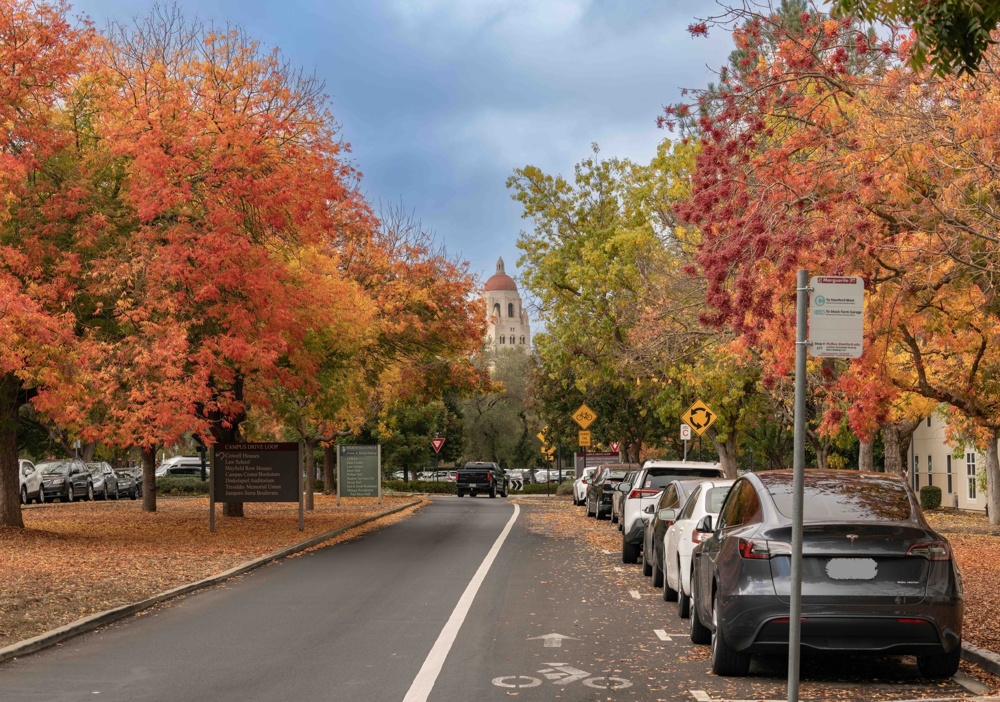

In [16]:
# Load a local image (feel free to replace with a natural image, e.g., a photo).
# Here we use a small image from this repo so the example runs offline.
image_path = "DSC03693-Enhanced-SR-small.jpg"  # relative to this notebook
image = Image.open(image_path).convert("RGB")
image

In [17]:
segments = image_segmentation_pipe(image)

`label_ids_to_fuse` unset. No instance will be fused.


In [18]:
# Display the segments output
# The output is a list of dictionaries, where each dictionary represents a detected segment with:
# - 'label': the predicted class/category (e.g., 'car', 'road', or generic labels like 'LABEL_197')
# - 'score': confidence score between 0 and 1 indicating the model's certainty
# - 'mask': a PIL Image object (mode=L, grayscale) representing the binary segmentation mask
segments

[{'score': 0.997921,
  'label': 'building',
  'mask': <PIL.Image.Image image mode=L size=2000x1404>},
 {'score': 0.999937,
  'label': 'car',
  'mask': <PIL.Image.Image image mode=L size=2000x1404>},
 {'score': 0.935968,
  'label': 'sidewalk, pavement',
  'mask': <PIL.Image.Image image mode=L size=2000x1404>},
 {'score': 0.972059,
  'label': 'tower',
  'mask': <PIL.Image.Image image mode=L size=2000x1404>},
 {'score': 0.999895,
  'label': 'tree',
  'mask': <PIL.Image.Image image mode=L size=2000x1404>},
 {'score': 0.981318,
  'label': 'earth, ground',
  'mask': <PIL.Image.Image image mode=L size=2000x1404>},
 {'score': 0.997593,
  'label': 'plant',
  'mask': <PIL.Image.Image image mode=L size=2000x1404>},
 {'score': 0.999518,
  'label': 'road, route',
  'mask': <PIL.Image.Image image mode=L size=2000x1404>},
 {'score': 0.999962,
  'label': 'sky',
  'mask': <PIL.Image.Image image mode=L size=2000x1404>},
 {'score': 0.999531,
  'label': 'signboard, sign',
  'mask': <PIL.Image.Image image 

In [19]:
print(f"Number of segments: {len(segments)}")
for seg in segments[:3]:  # show a few top segments
    print({"label": seg["label"], "score": float(seg["score"]), "area": seg.get("area", None)})

Number of segments: 10
{'label': 'building', 'score': 0.997921, 'area': None}
{'label': 'car', 'score': 0.999937, 'area': None}
{'label': 'sidewalk, pavement', 'score': 0.935968, 'area': None}


/var/folders/r3/rj0t5xcj557855yt3xr0qwnh0000gn/T/ipykernel_93010/63184903.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab20", len(segments))


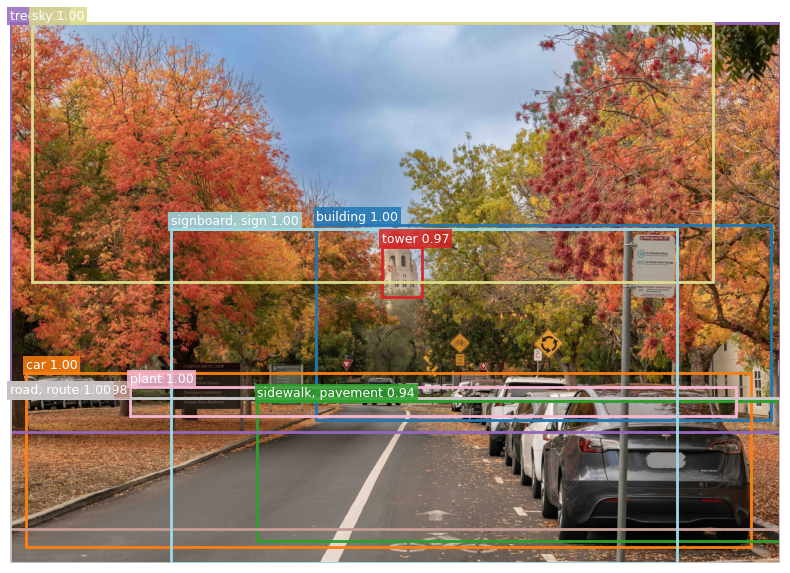

In [20]:
# Visualize bounding boxes and labels on the original image
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import patches

# Draw original image with per-segment bounding boxes and labels
fig, ax = plt.subplots(figsize=(8, 6))
ax.imshow(image)
ax.axis("off")

# Use a qualitative colormap to color different boxes
cmap = plt.cm.get_cmap("tab20", len(segments))

for idx, seg in enumerate(segments):
    mask = seg.get("mask", None)
    if mask is None:
        continue

    mask_arr = np.array(mask)
    # Some masks may come with extra channels; take a single channel
    if mask_arr.ndim == 3:
        mask_arr = mask_arr[..., 0]

    # Find the bounding rectangle of the mask
    ys, xs = np.where(mask_arr > 0)
    if ys.size == 0 or xs.size == 0:
        continue
    x_min, x_max = xs.min(), xs.max()
    y_min, y_max = ys.min(), ys.max()
    width = x_max - x_min + 1
    height = y_max - y_min + 1

    color = cmap(idx)
    rect = patches.Rectangle(
        (x_min, y_min), width, height, linewidth=2, edgecolor=color, facecolor="none"
    )
    ax.add_patch(rect)

    label_text = f"{seg.get('label', '')} {float(seg.get('score', 0.0)):.2f}"
    ax.text(
        x_min,
        max(0, y_min - 4),
        label_text,
        fontsize=9,
        color="white",
        bbox=dict(facecolor=color, alpha=0.85, edgecolor="none", pad=2),
        verticalalignment="bottom",
    )

plt.tight_layout()
plt.show()

## Dive into the details of transformers and large language models

### Tokenizers, input IDs, attention masks, tensors

Under the hood, a pipeline must convert raw text into tensors that a Transformer can consume. The main ingredients are:

**For the discussion in this lecture, we will focus on pipeline with text inputs, i.e., we focus on language models.**

- **Tokenizer** – splits text into sub-word tokens and maps them to integer IDs.

- **Why don't we use word-level tokenization?** - there are far too many words in the English vocabulary to have a unique ID for each word. Many of these words are rare and the language model cannot learn to predict them well despite the large amount of training data.

- The tokenizer is a part of the language model, different language models in general have different tokenizers with different sets of sub-word tokens.

- For each model, there is a set of sub-word tokens that the model is capable of using.

- The **tokenizer** splits text into a smaller amount of sub-word tokens, which are then mapped to integer IDs.

$$
\text{tokenizer}: \text{text} \rightarrow \text{list of sub-word tokens}
$$

In [21]:
# Create a tokenizer and inspect its outputs

MODEL_NAME = "gpt2"

# API: transformers.AutoTokenizer.from_pretrained — https://huggingface.co/docs/transformers/en/main_classes/tokenizer#transformers.AutoTokenizer.from_pretrained
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

In [22]:
# to call a tokenizer, we simply call the tokenizer on a text string.
text = "Transformers are powerful sequence models with a lot of trainable parameters"
# the tokenizer will split the text into a list of sub-word tokens and map each token to an integer ID.
# there are two components generated by the tokenizer:
# - `input_ids`: a list of integer IDs for each sub-word token.
# - `attention_mask`: a list of 1s/0s indicating which tokens are real vs. padding.
# In this single text example, all tokens are real and there is no padding going on.
tokenizer(text)

{'input_ids': [41762, 364, 389, 3665, 8379, 4981, 351, 257, 1256, 286, 4512, 540, 10007], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}

In [23]:
# let's see what's in each of these tokens.

def inspect_tokens(sample_text: str) -> None:
    """Pretty-print token, id, and character offsets for a given text."""
    enc = tokenizer(
        sample_text,
        return_offsets_mapping=True,  # start/end character positions per token
        add_special_tokens=True,
    )
    ids = enc["input_ids"]
    offsets = enc["offset_mapping"]
    tokens = tokenizer.convert_ids_to_tokens(ids)

    print(f"Text: {sample_text}\n")
    print(f"{'idx':>3} {'token':<20} {'id':>6} {'start':>5} {'end':>5}")
    for i, (tok, tid, (start, end)) in enumerate(zip(tokens, ids, offsets)):
        print(f"{i:>3} {tok:<20} {tid:>6} {start:>5} {end:>5}")

# Demo
inspect_tokens(text)

Text: Transformers are powerful sequence models with a lot of trainable parameters

idx token                    id start   end
  0 Transform             41762     0     9
  1 ers                     364     9    12
  2 Ġare                    389    12    16
  3 Ġpowerful              3665    16    25
  4 Ġsequence              8379    25    34
  5 Ġmodels                4981    34    41
  6 Ġwith                   351    41    46
  7 Ġa                      257    46    48
  8 Ġlot                   1256    48    52
  9 Ġof                     286    52    55
 10 Ġtrain                 4512    55    61
 11 able                    540    61    65
 12 Ġparameters           10007    65    76


**Observations:**

- **Sub-word splitting inside words**: the word "Transformers" is split into `Transform` (ID `41762`, characters `[0, 9)`) and `ers` (ID `364`, characters `[9, 12)`). The word "trainable" is split into `Ġtrain` (ID `4512`, `[55, 61)`) and `able` (ID `540`, `[61, 65)`). The model works with these pieces instead of whole words so it can represent many rare words using a smaller vocabulary.
- **Space marker `Ġ`**: tokens that start with `Ġ` (e.g., `Ġare`, `Ġpowerful`, `Ġsequence`) indicate that there is a space before the token in the original text. This lets the tokenizer distinguish between a word appearing at the start of a sentence vs. after a space, without storing the space as a separate token.

### Batch processing: tokenizing multiple texts at once

Why do we tokenize a *batch* of texts instead of one string at a time?

- **Efficiency on hardware (CPU/GPU/MPS)**: Transformers run on 2D tensors of shape `(batch_size, seq_len)`. Batching multiple examples into one tensor lets us use **vectorized operations** and **hardware parallelism**, which is much faster than looping over individual sentences in Python.
- Once we put all the texts into a batch and convert them into a tensor of tokens, the language model / transformer can use **vectorized operations** to update all the parameters using information from multiple examples at once.
- **Need for a rectangular tensor**: PyTorch tensors must be **rectangular**, so every sequence in a batch must have the **same length** (i.e., the same number of tokens). Raw texts rarely have identical lengths, which creates a mismatch.
- **Problem with uneven lengths**: if one sentence has 5 tokens and another has 20, we cannot directly stack them into a single 2D tensor without either truncating or padding. A "ragged" batch (different lengths per row) is not a valid tensor and would make the model code much more complicated.

How do we fix this? We **pad** shorter sequences:

- We choose a maximum length for the batch (e.g., the longest sequence in the batch), and append a special padding token `[PAD]` to any shorter sequence until all have the same length.
- This gives us a clean tensor of shape \((\text{batch\_size}, \text{max\_seq\_len})\), which the model can process in one go.
- Along with `input_ids`, the tokenizer also returns an **`attention_mask`**:
  - `attention_mask[i, j] = 1` means "this position is a real token" in the i-th sequence.
  - `attention_mask[i, j] = 0` means "this position is padding; the model should ignore it" in the i-th sequence.

In other words, padding makes batch shapes compatible, and the **attention mask** tells the model which positions are real text vs. padded filler.



In [24]:
text_batch = [
    # the first sentence is clearly longer than the second one.
    "Transformers are powerful sequence models with a lot of parameters.",
    # tokenizer can handle emojis as well, and ChatGPT seems to overemphasize these emoji tokens.
    "We ❤️ CME 193!",
    # Let's put a shorter version of the first sentence.
    "LLM is a type of transformer model.",
]

# Some tokenizers (like GPT-2) don't have a padding token by default.
# We need to set one before we can use padding=True.
if tokenizer.pad_token is None:
    # use the end of sequence token as the padding token
    tokenizer.pad_token = tokenizer.eos_token

# API: PreTrainedTokenizer.__call__ (tokenizer(...)) — https://huggingface.co/docs/transformers/en/main_classes/tokenizer#transformers.PreTrainedTokenizer.__call__
encoded = tokenizer(
    text_batch,
    padding=True,
    truncation=True,
    return_tensors="pt",  # PyTorch tensors
)

In [25]:
print("input_ids shape:", encoded["input_ids"].shape)
print("attention_mask shape:", encoded["attention_mask"].shape)

input_ids shape: torch.Size([3, 12])
attention_mask shape: torch.Size([3, 12])


In [26]:
# let's see what's in each of these list of tokens.
for i, text in enumerate(text_batch):
    print(f"\nText {i}: {text}")
    print(f"Token IDs: {encoded['input_ids'][i].tolist()}")
    print(f"Attention mask: {encoded['attention_mask'][i].tolist()}")
    print(f"Total tokens (including padding): {len(encoded['input_ids'][i])}")
    print(f"Non-padding tokens: {encoded['attention_mask'][i].sum().item()}")
    # Decode each token separately and join with |
    tokens = [tokenizer.decode([token_id]) for token_id in encoded['input_ids'][i]]
    print(f"Decoded: {' | '.join(tokens)}")


Text 0: Transformers are powerful sequence models with a lot of parameters.
Token IDs: [41762, 364, 389, 3665, 8379, 4981, 351, 257, 1256, 286, 10007, 13]
Attention mask: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Total tokens (including padding): 12
Non-padding tokens: 12
Decoded: Transform | ers |  are |  powerful |  sequence |  models |  with |  a |  lot |  of |  parameters | .

Text 1: We ❤️ CME 193!
Token IDs: [1135, 43074, 97, 37929, 327, 11682, 29691, 0, 50256, 50256, 50256, 50256]
Attention mask: [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0]
Total tokens (including padding): 12
Non-padding tokens: 8
Decoded: We |  � | � | ️ |  C | ME |  193 | ! | <|endoftext|> | <|endoftext|> | <|endoftext|> | <|endoftext|>

Text 2: LLM is a type of transformer model.
Token IDs: [3069, 44, 318, 257, 2099, 286, 47385, 2746, 13, 50256, 50256, 50256]
Attention mask: [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0]
Total tokens (including padding): 12
Non-padding tokens: 9
Decoded: LL | M |  is |  a |  type |  of |  transfo

### Observations:

- We see regular tokens plus the special `<|endoftext|>` token (ID `50256`), which is reused as padding at the end.
- **Sequence lengths and padding**:
  - All three texts are padded/truncated to **12 tokens** so they can form a single `(batch_size=3, seq_len=12)` tensor.
  - Text 0 has 12 real tokens and no padding.
  - Text 1 has 8 real tokens followed by 4 `<|endoftext|>` padding tokens (mask 0).
  - Text 2 has 9 real tokens followed by 3 `<|endoftext|>` padding tokens.
  This matches the attention masks: `1` for real tokens, `0` for padded `<|endoftext|>` positions.
- **Sub-word / BPE tokenization**:
  - "Transformers" is represented as two pieces: `Transform` and `ers`.
  - "LLM" becomes `LL` + `M`.
  - "CME" is split into `C` and `ME`, and `193` appears as a single numeric token.
  This byte-pair encoding (BPE) style lets the model compose rare words (and acronyms) from more frequent chunks.
- **Unicode and emoji handling**: the heart emoji (`❤️`) in Text 1 is broken into several tokens (`�`, `�`, `️`), which reflects its multi-byte representation and the fact that the vocabulary has no single dedicated token. The model still sees tokens there, but the semantics are noisier than for common words.

# Loading models with `AutoModel*`

In [27]:
# Loading a single sentiment model with `AutoModelForSequenceClassification`
from transformers import AutoModelForSequenceClassification, AutoTokenizer

# In many real-world tasks, we just need **one** model that already includes
# both the Transformer backbone and a small classification head on top.

MODEL_NAME = "distilbert-base-uncased-finetuned-sst-2-english"  # DistilBERT sentiment model

# Tokenizer: turns raw text into input_ids + attention_mask, we already covered this in the previous section.
sent_tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

# Model: backbone pretrained model with a classification head on top.
# This is a pre-trained (binary) sentiment classification model.
# It classifies text into two categories: positive or negative.
sent_model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME)
print(f"Loaded model: {MODEL_NAME}")
print("Number of labels:", sent_model.config.num_labels)
print("Label mapping:", sent_model.config.id2label)

Loaded model: distilbert-base-uncased-finetuned-sst-2-english
Number of labels: 2
Label mapping: {0: 'NEGATIVE', 1: 'POSITIVE'}


In [28]:
# The model belongs to a special class of models called `AutoModelForSequenceClassification` in the `transformers` library.
print(type(sent_model))

<class 'transformers.models.distilbert.modeling_distilbert.DistilBertForSequenceClassification'>


In [29]:
# But it is indeed another child PyTorch nn.Module
# just like the model we implemented in the previous lecture.
# you can check this using the isinstance function in Python.
import torch.nn as nn
print(f"Is the model a subclass of nn.Module? {isinstance(sent_model, nn.Module)}")

Is the model a subclass of nn.Module? True


In [30]:
# Therefore, attributes like `device` and `parameters` are available on transformer models loaded in the transformers library.
print(sent_model.device)
# we can also count the number of parameters in the model.
print(f"Number of parameters in the model: {sum(p.numel() for p in sent_model.parameters())}")

cpu
Number of parameters in the model: 66955010


In [31]:
# Suppose we have a batch of texts, and we want to classify them into positive or negative using this pre-trained model.
texts = [
    "CME 193 is my favorite class this quarter!",
    "The documentation was confusing and the model behaved unpredictably.",
    "There is one lecture per week.",
    "There is only one lecture per week.",
]

In [32]:
# As mentioned, the pre-trained model was trained to understand and process a bunch of tokens in its vocabulary set (i.e., set of tokens).
# We will first use the corresponding tokenizer to convert the raw texts into a batch tensor of tokens.
# Tokenize into a batch tensor for the model that this pre-trained model is able to process.
encoded = sent_tokenizer(
    texts,
    padding=True,
    truncation=True,
    return_tensors="pt",
)
print("\ninput_ids shape:", encoded["input_ids"].shape)
print("attention_mask shape:", encoded["attention_mask"].shape)


input_ids shape: torch.Size([4, 15])
attention_mask shape: torch.Size([4, 15])


In [33]:
from pprint import pprint
# The tokenizer converts each text into a sequence of token IDs.
# Shorter sequences are padded with 0s to match the longest sequence in the batch.
# The first row has padding (0s) because it's shorter than the second row.
pprint(encoded.input_ids)

tensor([[  101,  4642,  2063, 19984,  2003,  2026,  5440,  2465,  2023,  4284,
           999,   102,     0,     0,     0],
        [  101,  1996, 12653,  2001, 16801,  1998,  1996,  2944, 26979,  4895,
         28139, 29201,  8231,  1012,   102],
        [  101,  2045,  2003,  2028,  8835,  2566,  2733,  1012,   102,     0,
             0,     0,     0,     0,     0],
        [  101,  2045,  2003,  2069,  2028,  8835,  2566,  2733,  1012,   102,
             0,     0,     0,     0,     0]])


In [34]:
# The attention mask tells the model which tokens are real (1) and which are padding (0).
# The first row has 0s at the end because it was padded to match the second row's length.
# The model will ignore positions where the mask is 0 during computation.
pprint(encoded.attention_mask)

tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0]])


In [35]:
encoded.keys()

KeysView({'input_ids': tensor([[  101,  4642,  2063, 19984,  2003,  2026,  5440,  2465,  2023,  4284,
           999,   102,     0,     0,     0],
        [  101,  1996, 12653,  2001, 16801,  1998,  1996,  2944, 26979,  4895,
         28139, 29201,  8231,  1012,   102],
        [  101,  2045,  2003,  2028,  8835,  2566,  2733,  1012,   102,     0,
             0,     0,     0,     0,     0],
        [  101,  2045,  2003,  2069,  2028,  8835,  2566,  2733,  1012,   102,
             0,     0,     0,     0,     0]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0]])})

In [36]:
# Forward pass through the model
# We pass the input_ids and attention_mask to the model
outputs = sent_model(input_ids=encoded["input_ids"], attention_mask=encoded["attention_mask"])
# you can also do sent_model(**encoded) - this is called "dictionary unpacking" in Python.

# The model returns a SequenceClassifierOutput object containing:
# - logits: raw prediction scores for each class (shape: [batch_size, num_labels])
#   Higher logits indicate stronger confidence for that class
# - loss: None (only computed during training with labels)
# - hidden_states: None (internal representations, available if output_hidden_states=True)
# - the hidden states are useful for model training for example, but we don't need them for inference.
# - attentions: None (attention weights, available if output_attentions=True)
outputs

SequenceClassifierOutput(loss=None, logits=tensor([[-3.3076,  3.4661],
        [ 3.5651, -2.9605],
        [ 0.3541, -0.1688],
        [ 2.3589, -1.9437]], grad_fn=<AddmmBackward0>), hidden_states=None, attentions=None)

In [37]:
logits = outputs.logits
print("Logits shape:", logits.shape)  # (batch_size, num_labels)

Logits shape: torch.Size([4, 2])


In [38]:
# Convert logits to predicted labels and probabilities
import torch.nn.functional as F

# Apply softmax to convert logits to probabilities
probs = F.softmax(logits, dim=-1)

# Get predicted class IDs and their probabilities
pred_ids = logits.argmax(dim=-1).tolist()
pred_labels = [sent_model.config.id2label[i] for i in pred_ids]

# Display results with probabilities
for i, (text, label) in enumerate(zip(texts, pred_labels)):
    prob = probs[i].max().item()  # Get the probability of the predicted class
    print(f"\nText: {text}\nPredicted label: {label}\nConfidence: {prob:.4f}")


Text: CME 193 is my favorite class this quarter!
Predicted label: POSITIVE
Confidence: 0.9989

Text: The documentation was confusing and the model behaved unpredictably.
Predicted label: NEGATIVE
Confidence: 0.9985

Text: There is one lecture per week.
Predicted label: NEGATIVE
Confidence: 0.6278

Text: There is only one lecture per week.
Predicted label: NEGATIVE
Confidence: 0.9866


# Device management and performance

This section connects our Transformer examples to **HPC / numerical computing** ideas: devices, batching, and reproducibility.

CPU vs GPU/MPS (covered last lecture)

- **Device choices**:
  - **CPU**: universally available; good for small models and debugging, but slower for large matrix operations.
  - **CUDA (NVIDIA GPUs)**: highly optimized for parallel linear algebra; often gives large speedups for big batches and models.
  - **MPS (Apple Silicon)**: Apple’s Metal backend for M1/M2/M3 chips; similar idea to CUDA but vendor-specific.
- **PyTorch device pattern**:
  - Detect the best device (e.g., `"cuda"` if available, else `"mps"`, else `"cpu"`).
  - Move the **model** and all **input tensors** to that device before running forward passes.
  - The code cell below implements exactly this pattern and prints the chosen device.

In [39]:
import time
import torch

# Pick the best available device: CUDA (NVIDIA GPU) → MPS (Apple Silicon) → CPU
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("CUDA GPU detected - using GPU acceleration")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
    print("Apple Silicon detected - using MPS acceleration")
else:
    device = torch.device("cpu")
    print("No GPU detected - using CPU")

print(f"Using device: {device}")

Apple Silicon detected - using MPS acceleration
Using device: mps


In [40]:
# Create a batch of texts
texts = [
    "CME 193 is my favorite class this quarter!",
    "The documentation was confusing and the model behaved unpredictably.",
    "Transformers are powerful sequence models.",
    "We ❤️ CME 193!",
] * 8  # batch_size = 32

# Tokenize on CPU
encoded = sent_tokenizer(
    texts,
    padding=True,
    truncation=True,
    return_tensors="pt",
)

print("input_ids shape:", encoded["input_ids"].shape)

input_ids shape: torch.Size([32, 15])


In [41]:
# Test on CPU
print("\nTesting on CPU...")

# As we discussed in the previous lecture, you can use the `.to("cpu")` method to move the model and tensors to any target device.
sent_model.to("cpu")
encoded_cpu = {k: v.to("cpu") for k, v in encoded.items()}


Testing on CPU...


In [42]:
sent_model.eval()
with torch.no_grad():
    # Warm-up
    _ = sent_model(**encoded_cpu)

    # Time it
    iters = 10
    start = time.perf_counter()
    for _ in range(iters):
        _ = sent_model(**encoded_cpu)
    end = time.perf_counter()

cpu_time = (end - start) * 1000 / iters
print(f"  Average time: {cpu_time:.2f} ms for batch_size={len(texts)}")

  Average time: 60.27 ms for batch_size=32


In [43]:
# Test on MPS if available
# If you don't have an MPS device, you can skip this part or use GPU.
if torch.backends.mps.is_available():
    print("\nTesting on MPS...")
    sent_model.to("mps")
    encoded_mps = {k: v.to("mps") for k, v in encoded.items()}

    with torch.no_grad():
        # Warm-up
        _ = sent_model(**encoded_mps)

        # Time it
        start = time.perf_counter()
        for _ in range(iters):
            _ = sent_model(**encoded_mps)
        end = time.perf_counter()

    mps_time = (end - start) * 1000 / iters
    print(f"  Average time: {mps_time:.2f} ms for batch_size={len(texts)}")

    speedup = cpu_time / mps_time
    print(f"\nSpeedup (MPS vs CPU): {speedup:.2f}x")


Testing on MPS...
  Average time: 13.15 ms for batch_size=32

Speedup (MPS vs CPU): 4.58x


# A minimal fine-tuning example (Optional)

So far we have treated Transformers as **frozen feature extractors** or ready-made pipelines. In practice, many interesting problems live somewhere between "exactly the pre-training task" and "completely new from scratch". **Fine-tuning bridges this gap.**

- **Why do we care about fine-tuning?**
  - Most public models are trained on **general web or book corpora**, but your task (e.g., legal documents, support tickets, product reviews) has its **own style, labels, and edge cases**.
  - Training from scratch would require *millions–billions* of examples and huge compute; fine-tuning lets you adapt a pre-trained model with **hundreds or thousands of labeled examples** instead.
  - In practice, fine-tuning usually yields **much better task-specific performance** than using a pre-trained model as-is, especially on domain-specific text.

- **High-level recipe (you do NOT need to memorize the code):**
  1. **Start from a pre-trained checkpoint** (e.g., `distilbert-base-uncased-finetuned-sst-2-english`).
  2. **Wrap it in `AutoModelForSequenceClassification`** (or another `AutoModel*` variant) so it exposes a task-specific head.
  3. **Load and tokenize a small labeled dataset** (text + label → `input_ids`, `attention_mask`, `label`).
  4. **Define training hyperparameters** with `TrainingArguments` (batch size, epochs, learning rate, etc.).
  5. **Use `Trainer`** to handle batching, optimization, and (optionally) validation metrics.

- **Pedagogical focus for this notebook:**
  - See *how little extra code* is needed to go from inference → fine-tuning using `datasets` + `transformers`.
  - Understand why fine-tuning is **data-efficient** and how it leverages knowledge stored in pre-trained weights.
  - Briefly touch on **train/validation splits, metrics, and overfitting** (even a large model can easily overfit a tiny dataset).

The code cell below is intentionally small and self-contained so you can read it as a **worked example**, not a production recipe.

In [44]:
# Minimal-scale fine-tuning on a tiny synthetic sentiment dataset
"""Optional: show how to adapt a pre-trained model with a very small labeled dataset.

This cell is meant as a *worked example* that you can read line-by-line later,
not something to memorize. The goal is to demystify the fine-tuning workflow.
"""

from datasets import Dataset
from transformers import (
    AutoModelForSequenceClassification,
    AutoTokenizer,
    Trainer,
    TrainingArguments,
)
import numpy as np
import torch

# For reproducibility (so runs are reasonably similar each time)
SEED = 193
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# We fine-tune a small DistilBERT sentiment model from the Hugging Face Hub.
MODEL_NAME = "distilbert-base-uncased-finetuned-sst-2-english"
# 1. Create a tiny in-memory dataset (positive vs. negative movie/product reviews)
#    In real projects you would load thousands/millions of rows from disk;
#    here we keep everything in a small Python list so the example fits on one slide.
train_texts = [
    "This movie was fantastic and I loved every minute.",
    "The app is intuitive and very easy to use.",
    "Customer support was helpful and resolved my issue quickly.",
    "The restaurant had great food and friendly staff.",
    "The product broke after a few days and was very disappointing.",
    "The website was slow, confusing, and full of bugs.",
]
# 1 = POSITIVE, 0 = NEGATIVE (matches the SST-2 sentiment label convention)
train_labels = [1, 1, 1, 1, 0, 0]

# Wrap the lists into a small Hugging Face `Dataset` object so we can use
# the same API as for larger text datasets from the Hub.
train_dataset = Dataset.from_dict({"text": train_texts, "label": train_labels})

# 2. Load tokenizer and model
#    We reuse the same pre-trained DistilBERT sentiment model as in the
#    earlier inference examples, but now we will *update its weights*.
ft_tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
ft_model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME)

# For this demo we force everything onto CPU so it runs on machines
# without a GPU and so that timing/behavior is more predictable.
ft_model = ft_model.to("cpu")

# 3. Tokenization function for the Dataset
#    This mirrors earlier tokenization, but now we plug it into `datasets.Dataset`.

def tokenize_batch(batch: dict) -> dict:
    """Turn a batch of raw texts into model-ready token IDs and attention masks."""
    return ft_tokenizer(
        batch["text"],
        padding="max_length",   # pad all examples to the same length
        truncation=True,         # cut off overly long texts
        max_length=64,
    )

# Apply the tokenizer to the whole dataset in a vectorized way
train_tokenized = train_dataset.map(tokenize_batch, batched=True)

# Set format so that indexing returns PyTorch tensors for the Trainer
train_tokenized = train_tokenized.remove_columns(["text"])
train_tokenized.set_format("torch")

# 4. Define training arguments (very small-scale!)
#    `TrainingArguments` configures how the `Trainer` runs the training loop.
training_args = TrainingArguments(
    output_dir="./tiny_cme193_finetune",   # where to save checkpoints/logs
    num_train_epochs=3,                     # very small number of epochs
    per_device_train_batch_size=4,          # tiny batch size to keep memory low
    learning_rate=5e-5,                     # standard fine-tuning LR for BERT-like models
    weight_decay=0.0,
    logging_steps=1,                        # log every step (since dataset is tiny)
    report_to=[],                           # disable external loggers (e.g., wandb)
    use_cpu=True,                           # Force CPU usage for this demo
)

# 5. Create Trainer and run a tiny training loop
#    The `Trainer` handles batching, shuffling, optimizer steps, and logging for us.
trainer = Trainer(
    model=ft_model,
    args=training_args,
    train_dataset=train_tokenized,
)

print("Starting tiny fine-tuning run on CPU (this should be quick)...")
trainer.train()

# 6. Inspect predictions on a few held-out examples
ft_model.eval()
examples = [
    "The new phone works great and the battery lasts all day.",
    "The service was terrible and I would not recommend this company.",
]
encoded = ft_tokenizer(
    examples,
    padding=True,
    truncation=True,
    return_tensors="pt",
)
# Ensure inputs are on CPU
encoded = {k: v.to("cpu") for k, v in encoded.items()}
with torch.no_grad():
    outputs = ft_model(**encoded)
probs = torch.softmax(outputs.logits, dim=-1)
pred_ids = probs.argmax(dim=-1).tolist()

id2label = ft_model.config.id2label
for text, pid, p in zip(examples, pred_ids, probs):
    prob = float(p[pid])
    print("\nText:", text)
    print(f"Predicted label: {id2label[pid]} (prob={prob:.3f})")

Map: 100%|██████████| 6/6 [00:00<00:00, 872.99 examples/s]


Starting tiny fine-tuning run on CPU (this should be quick)...


Step,Training Loss
1,0.003800
2,0.000300
3,0.000300
4,0.000100
5,0.000100
6,0.000200



Text: The new phone works great and the battery lasts all day.
Predicted label: POSITIVE (prob=1.000)

Text: The service was terrible and I would not recommend this company.
Predicted label: NEGATIVE (prob=0.999)


# Don't forget to submit the attendance questionnaire and have a great Thanksgiving break (no class next week)!

![Attendance Form](images/CME193_Lecture_9_Attendance_Form.png)